In [1]:
# pip install networkx

In [2]:
import networkx as nx

In [3]:
# pip install scikit-learn

In [4]:
import numpy as np

In [5]:
import sklearn

In [6]:
# pip install osmnx

In [7]:
import osmnx as ox

In [8]:
# pip install mapclassify

In [9]:
import mapclassify

In [10]:
import matplotlib

In [11]:
# pip install folium

In [12]:
import folium

In [13]:
# pip install geopy

In [14]:
from geopy.geocoders import Nominatim

In [15]:
import pandas as pd

In [16]:
import urllib.request, urllib.error, urllib.parse
import json

## Use networkx and osmnx to view nodes and edges of an area

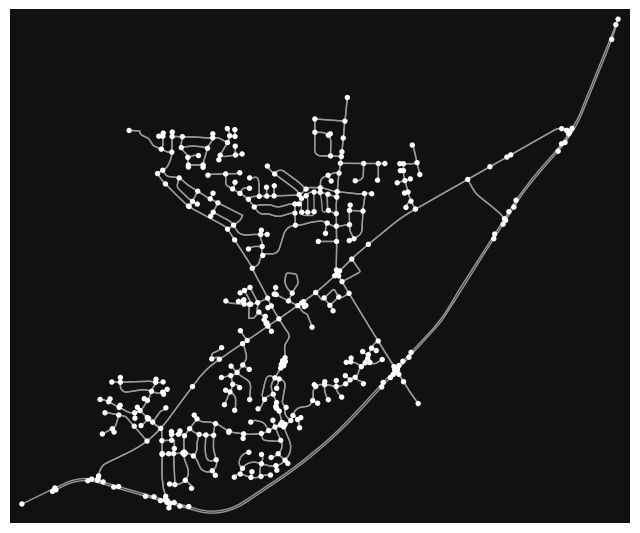

(<Figure size 800x800 with 1 Axes>, <AxesSubplot: >)

In [17]:
# download and model the street network for an area:
G = ox.graph_from_place("Rolesville, NC, USA", network_type="drive") # G is an input graph

# visualize it
ox.plot_graph(G)

In [18]:
# Convert node and edge GeoDataFrames to a MultiDiGraph.

nodes, edges = ox.graph_to_gdfs(G)
nodes.head(5)

,y,x,street_count,highway,geometry
osmid,,,,,
195423398,35.934436,-78.454109,3,NaN,POINT (-78.45411 35.93444)
195423410,35.932684,-78.455163,1,turning_circle,POINT (-78.45516 35.93268)
195429877,35.928673,-78.436330,4,NaN,POINT (-78.43633 35.92867)
195429896,35.932820,-78.441078,3,NaN,POINT (-78.44108 35.93282)
195433212,35.924740,-78.455603,3,NaN,POINT (-78.45560 35.92474)


Coordinates of starting and ending: (35.9264448,-78.4624239) ==> (35.9181458,-78.4686471)

In [19]:
# get the nearest network node to the origin point and destination point (x (longitude) & y (latitude) coordinates)
orig_node = ox.nearest_nodes(G, X= -78.4624239, Y = 35.9264448)
dest_node = ox.nearest_nodes(G, X= -78.4686471, Y = 35.9181458)

In [20]:
print(orig_node)
print(dest_node)

1308230394
1308259953


In [21]:
# Solve shortest path from origin node(s) to destination node(s).
route = nx.shortest_path(G, orig_node, dest_node, 
                         weight='length') # find the shortest path by minimizing distance traveled 

In [22]:
route

[1308230394,
 7404054525,
 1308230485,
 6625198617,
 3312728292,
 195447569,
 3312728282,
 1308259958,
 1308259953]

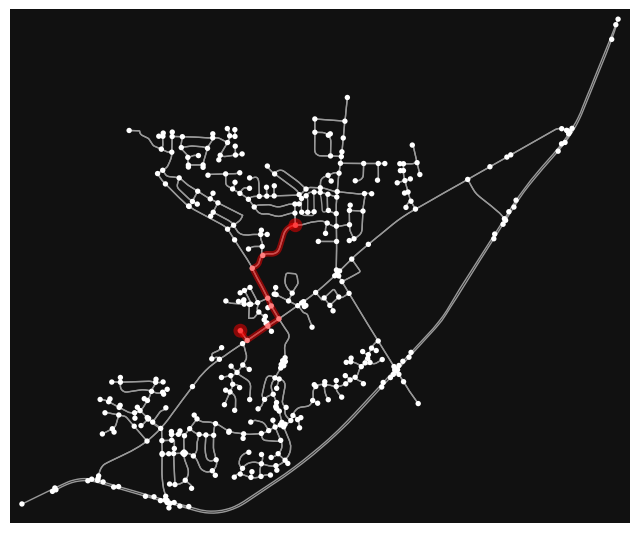

(<Figure size 800x800 with 1 Axes>, <AxesSubplot: >)

In [23]:
ox.plot_graph_route(G, route) #, route_linewidth=6, node_size=0, bgcolor='k')

## Use osmnx.folium module to view nodes and edges of an area

In [24]:
ox.plot_graph_folium(G)

## Use GeoDataFrame to color osmnx edges by areas

In [25]:
place = ["Rolesville, NC", "Garner, NC", "Apex, NC"]
gdf_nodes = gdf_edges = None
for place in place:
    # Create graph from OSM within the boundaries of some geocodable place(s).
    G2 = ox.graph_from_place(place, retain_all=True, network_type='drive')
    # Convert node and edge GeoDataFrames to a MultiDiGraph.
    nodes2, edges2 = ox.graph_to_gdfs(G2)
    nodes2["place"] = place
    edges2["place"] = place
    if gdf_nodes is None:
        gdf_nodes = nodes2
        gdf_edges = edges2
    else:
        gdf_nodes = pd.concat([gdf_nodes, nodes2])
        gdf_edges = pd.concat([gdf_edges, edges2])

# returns Folium Map instance
gdf_edges.explore(column="place", cmap='spring', # matplotlib.Colormap
                  height=500, width=1000) 

In [26]:
gdf_edges.head()

osmid               name      highway  oneway  \
u         v          key                                                      
195398921 7868110123 0    718023890    Ivy Creek Trail  residential   False   
195423398 195595367  0     18906457  Watkins Farm Road  residential   False   
          195595365  0     18906457  Watkins Farm Road  residential   False   
          195423410  0     18891729       Siron Circle  residential   False   
195423410 195423398  0     18891729       Siron Circle  residential   False   

                         reversed   length  \
u         v          key                     
195398921 7868110123 0       True  240.213   
195423398 195595367  0      False  164.833   
          195595365  0       True  262.187   
          195423410  0      False  255.579   
195423410 195423398  0       True  255.579   

                                                                   geometry  \
u         v          key                                                      
195398921 7868110123 0    LINESTRING (-78.49610 35.93068, -78.49620 35.9...   
195423398 195595367  0    LINESTRING (-78.45411 35.93444, -78.45228 35.9...   
          195595365  0    LINESTRING (-78.45411 35.93444, -78.45702 35.9...   
          195423410  0    LINESTRING (-78.45411 35.93444, -78.45415 35.9...   
195423410 195423398  0    LINESTRING (-78.45516 35.93268, -78.45491 35.9...   

                          ref maxspeed lanes bridge junction           place  \
u         v          key                                                       
195398921 7868110123 0    NaN      NaN   NaN    NaN      NaN  Rolesville, NC   
195423398 195595367  0    NaN      NaN   NaN    NaN      NaN  Rolesville, NC   
          195595365  0    NaN      NaN   NaN    NaN      NaN  Rolesville, NC   
          195423410  0    NaN      NaN   NaN    NaN      NaN  Rolesville, NC   
195423410 195423398  0    NaN      NaN   NaN    NaN      NaN  Rolesville, NC   

                         access  
u         v          key         
195398921 7868110123 0      NaN  
195423398 195595367  0      NaN  
          195595365  0      NaN  
          195423410  0      NaN  
195423410 195423398  0      NaN

## Show route in a default background

In [27]:
ox.plot_route_folium(G, route, color='#cc0000', weight=5, opacity=0.8)

## Show route in a not-so-transparent background

In [28]:
# set up background
m1 = folium.Map()

# show route
ox.plot_route_folium(G, route, route_map=m1, color='#cc0000', weight=5, opacity=0.8)

## Impute a new speed column `speed_kph` on all edges missing `maxspeed` data

By default, this imputes free-flow travel speeds for all edges via the **mean maxspeed value** of the edges of each highway type. 

This default mean-imputation can obviously be imprecise, and the user can **override it by passing in hwy_speeds** and/or fallback arguments that correspond to local speed limit standards. 

In [29]:
edges.head(3)

osmid               name      highway  oneway  \
u         v         key                                                     
195423398 195595367 0    18906457  Watkins Farm Road  residential   False   
          195595365 0    18906457  Watkins Farm Road  residential   False   
          195423410 0    18891729       Siron Circle  residential   False   

                        reversed   length  \
u         v         key                     
195423398 195595367 0      False  164.833   
          195595365 0       True  262.187   
          195423410 0      False  255.579   

                                                                  geometry  \
u         v         key                                                      
195423398 195595367 0    LINESTRING (-78.45411 35.93444, -78.45228 35.9...   
          195595365 0    LINESTRING (-78.45411 35.93444, -78.45702 35.9...   
          195423410 0    LINESTRING (-78.45411 35.93444, -78.45415 35.9...   

                         ref maxspeed lanes bridge junction  
u         v         key                                      
195423398 195595367 0    NaN      NaN   NaN    NaN      NaN  
          195595365 0    NaN      NaN   NaN    NaN      NaN  
          195423410 0    NaN      NaN   NaN    NaN      NaN

No `speed_kph` yet

In [30]:
edges.groupby('highway').count()['name'] # documentation: https://wiki.openstreetmap.org/wiki/Key:highway

highway
living_street       0
primary            49
primary_link        7
residential       606
secondary          84
secondary_link     10
tertiary           46
tertiary_link       4
Name: name, dtype: int64

In [31]:
speed_dict = {'residential': 56.3, # Often lined with housing.
              'secondary': 88.5, # Often link towns.
              'primary': 88.5, # Often link larger towns
              'tertiary': 97} # Often link smaller towns and villages

G3 = ox.add_edge_speeds(G, hwy_speeds = speed_dict)

nodes3, edges3 = ox.graph_to_gdfs(G3)

edges3.head(3)

osmid               name      highway  oneway  \
u         v         key                                                     
195423398 195595367 0    18906457  Watkins Farm Road  residential   False   
          195595365 0    18906457  Watkins Farm Road  residential   False   
          195423410 0    18891729       Siron Circle  residential   False   

                        reversed   length  speed_kph  \
u         v         key                                
195423398 195595367 0      False  164.833       56.3   
          195595365 0       True  262.187       56.3   
          195423410 0      False  255.579       56.3   

                                                                  geometry  \
u         v         key                                                      
195423398 195595367 0    LINESTRING (-78.45411 35.93444, -78.45228 35.9...   
          195595365 0    LINESTRING (-78.45411 35.93444, -78.45702 35.9...   
          195423410 0    LINESTRING (-78.45411 35.93444, -78.45415 35.9...   

                         ref maxspeed lanes bridge junction  
u         v         key                                      
195423398 195595367 0    NaN      NaN   NaN    NaN      NaN  
          195595365 0    NaN      NaN   NaN    NaN      NaN  
          195423410 0    NaN      NaN   NaN    NaN      NaN

In [32]:
# Calculates free-flow travel time along each edge, based on length and speed_kph attributes. 
G3 = ox.add_edge_travel_times(G3)

nodes3, edges3 = ox.graph_to_gdfs(G3)

edges3.head(3)

osmid               name      highway  oneway  \
u         v         key                                                     
195423398 195595367 0    18906457  Watkins Farm Road  residential   False   
          195595365 0    18906457  Watkins Farm Road  residential   False   
          195423410 0    18891729       Siron Circle  residential   False   

                        reversed   length  speed_kph  travel_time  \
u         v         key                                             
195423398 195595367 0      False  164.833       56.3         10.5   
          195595365 0       True  262.187       56.3         16.8   
          195423410 0      False  255.579       56.3         16.3   

                                                                  geometry  \
u         v         key                                                      
195423398 195595367 0    LINESTRING (-78.45411 35.93444, -78.45228 35.9...   
          195595365 0    LINESTRING (-78.45411 35.93444, -78.45702 35.9...   
          195423410 0    LINESTRING (-78.45411 35.93444, -78.45415 35.9...   

                         ref maxspeed lanes bridge junction  
u         v         key                                      
195423398 195595367 0    NaN      NaN   NaN    NaN      NaN  
          195595365 0    NaN      NaN   NaN    NaN      NaN  
          195423410 0    NaN      NaN   NaN    NaN      NaN

Take the first row (`u=195423398` & `v=195595367`) as an example: 56.3 km_per_hr /(60x60) x 10.5 sec = 0.164 km = 164 m

## Compare two ways to solve shortest path

In [33]:
route_length = nx.shortest_path(G3, orig_node, dest_node, 
                                weight='length') # find the shortest path by minimizing distance traveled 
route_time = nx.shortest_path(G3, orig_node, dest_node, 
                              weight='travel_time') # find the shortest path by minimizing distance traveled 

In [34]:
m1 = folium.Map(height=400, width=600)
ox.plot_route_folium(G3, route_length, route_map=m1, color='#cc0000', weight=5, opacity=0.8)

In [35]:
m1 = folium.Map(height=400, width=600)
ox.plot_route_folium(G3, route_time, route_map=m1, color='#cc0000', weight=5, opacity=0.8)

Looks the same b/c the distance is too short

## Let's try on a longer travel

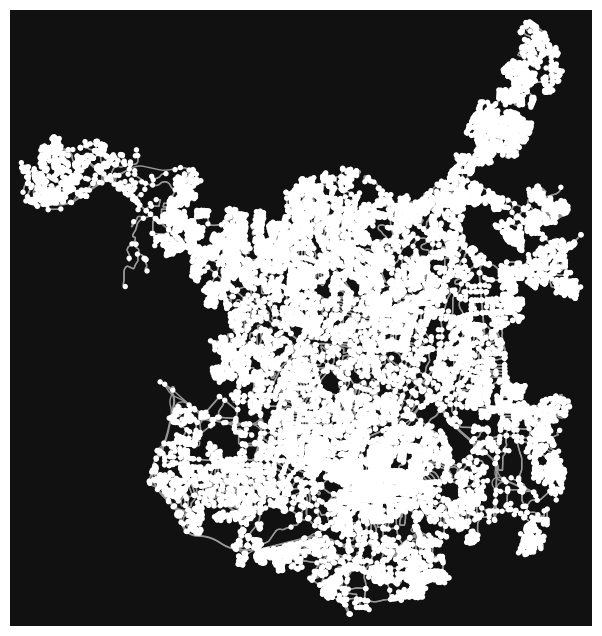

(<Figure size 800x800 with 1 Axes>, <AxesSubplot: >)

In [36]:
G4 = ox.graph_from_place("Raleigh, USA", network_type="drive") 

ox.plot_graph(G4)

In [37]:
node_r , edge_r = ox.graph_to_gdfs(G4)
x = []
for i in edge_r['highway'].values:
    if i not in x:
        x.append(i)
x

['residential',
 'tertiary',
 'primary',
 'secondary',
 'primary_link',
 'motorway_link',
 'motorway',
 'trunk',
 'trunk_link',
 'unclassified',
 'tertiary_link',
 ['residential', 'tertiary'],
 'secondary_link',
 ['unclassified', 'residential'],
 ['primary_link', 'residential']]

In [38]:
G4 = ox.add_edge_speeds(G4, hwy_speeds = speed_dict)
G4 = ox.add_edge_travel_times(G4)

nodes4, edges4 = ox.graph_to_gdfs(G4)

# starting: 35.9158332,-78.4714274 #Rolesville Town Hall
# ending: 35.7891446,-78.8509757 #H mart @ Cary
orig_node4 = ox.nearest_nodes(G4, X= -78.4714274, Y = 35.9158332)
dest_node4 = ox.nearest_nodes(G4, X= -78.8509757, Y = 35.7891446)

route_length4 = nx.shortest_path(G4, orig_node4, dest_node4, weight='length')
route_time4 = nx.shortest_path(G4, orig_node4, dest_node4, weight='travel_time') 

In [39]:
orig_node4

1308994181

In [40]:
dest_node4

2553091213

Minimal travel distance

In [41]:
m1 = folium.Map(height=400, width=600)
ox.plot_route_folium(G4, route_length4, route_map=m1, color='#cc0000', weight=5, opacity=0.8)

Minimal travel time

In [42]:
m1 = folium.Map(height=400, width=600)
ox.plot_route_folium(G4, route_time4, route_map=m1, color='#cc0000', weight=5, opacity=0.8)

Yay, the results are different now!

## Automatically get GeoLocation

In [43]:
# Create GeoDataFrame of OSM entities within boundaries of geocodable place(s).
def make_graph_geocodable_place(places):
    if type(places) == list and len(places) > 1:
        
        print(places[0]+' is being graphed...')
        G = ox.graph_from_place(places[0], network_type="drive") 
        
        for i in range(1, len(places)):
            
            print(places[i]+' is being graphed...')            
            G1 = ox.graph_from_place(places[i], network_type="drive") 
            
            # Compose two graphs by combining nodes and edges into a single graph.
            G = nx.compose(G, G1) 
            
    else:
        G = ox.graph_from_place(places, network_type="drive") 
    
    print(ox.plot_graph(G))
    
    return G

Rolesville, NC is being graphed...
Raleigh, NC is being graphed...
Cary, NC is being graphed...
Wake Forest, NC is being graphed...
Apex, NC is being graphed...


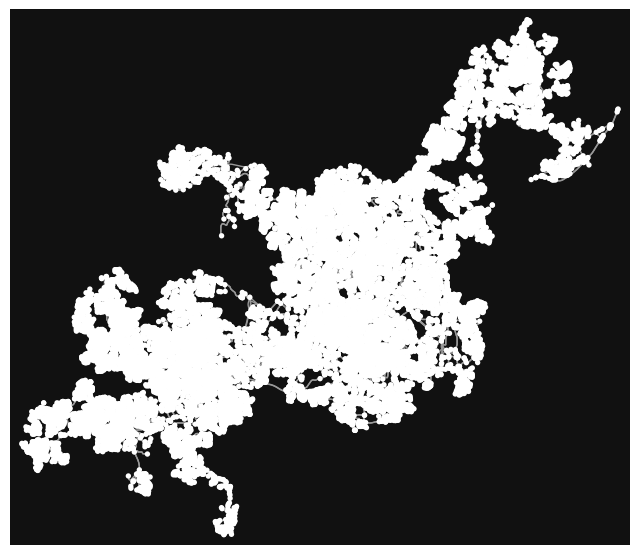

(<Figure size 800x800 with 1 Axes>, <AxesSubplot: >)


In [44]:
G_new = make_graph_geocodable_place(['Rolesville, NC', 'Raleigh, NC', 'Cary, NC', 'Wake Forest, NC', 'Apex, NC'])

In [45]:
# Create GeoDataFrame of OSM entities within some distance N, S, E, W of a point.
def make_graph_point(point, dist=50000): 
    G = ox.graph_from_point(point, dist=dist, # dist is in meters
                            network_type="drive") 
    
    print(ox.plot_graph(G))
    
    return G

In [46]:
def get_geoloc(name):
    # calling the Nominatim tool
    loc = Nominatim(user_agent="GetLoc")

    # entering the location name
    getLoc = loc.geocode(name)
 
    print(getLoc.address)
    print(getLoc.latitude, getLoc.longitude,'\n')
    
    return getLoc.latitude, getLoc.longitude

Raleigh, Wake County, North Carolina, United States
35.7803977 -78.6390989 



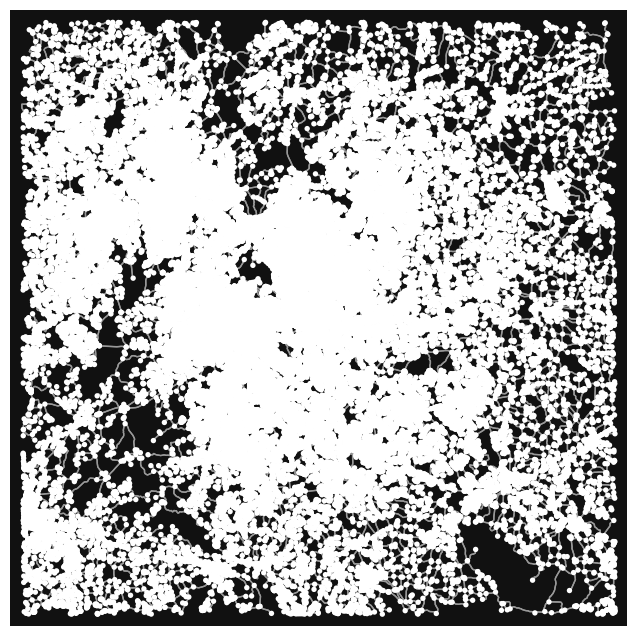

(<Figure size 800x800 with 1 Axes>, <AxesSubplot: >)


In [47]:
G_new = make_graph_point(get_geoloc('Raleigh'))

In [48]:
orig_coor = get_geoloc('Rolesville Town Hall')
dest_coor = get_geoloc('UNC at Chapel Hill')

Rolesville Town Hall, 502, Southtown Circle, Rolesville, Wake County, North Carolina, 27571, United States
35.9158439 -78.4714535 

University of North Carolina, NCNB Aly, Franklin-Rosemary Historic District, Downtown, Chapel Hill, Orange County, North Carolina, 27515, United States
35.90503535 -79.04775326525107 



In [49]:
def get_orig_dest_nodes(G, orig_coor, dest_coor):
    orig_node = ox.nearest_nodes(G, X= orig_coor[1], Y = orig_coor[0])
    dest_node = ox.nearest_nodes(G, X= dest_coor[1], Y = dest_coor[0])
    
    return orig_node, dest_node

In [51]:
orig_node, dest_node = get_orig_dest_nodes(G_new, orig_coor, dest_coor)

In [52]:
def get_shortest_route(G, orig_node, dest_node, method):
    return nx.shortest_path(G, orig_node, dest_node, weight=method) 

Minimal travel distance

In [53]:
r_length = get_shortest_route(G_new, orig_node, dest_node, method='length')

m1 = folium.Map(height=400, width=600)
ox.plot_route_folium(G_new, r_length, route_map=m1, color='#cc0000', weight=5, opacity=0.8)

Minimal travel time

In [54]:
r_time = get_shortest_route(G_new, orig_node, dest_node, method='travel_time')

m1 = folium.Map(height=400, width=600)
ox.plot_route_folium(G_new, r_time, route_map=m1, color='#cc0000', weight=5, opacity=0.8)

## Get the distance

#### use built-in function

In [55]:
ox.distance.euclidean_dist_vec(orig_coor[0], orig_coor[1], dest_coor[0], dest_coor[1])

0.5764011139662651

Above is in coordinates’ unit. For 69.172 miles per degree, 0.576 coordinate unit equals 39.8 miles. It is pretty close to the 37.8 miles on Google Map.

#### use edge data

In [58]:
def get_geodf(G):
    return ox.graph_to_gdfs(G)

In [59]:
nodes_new, edges_new = get_geodf(G_new)

In [60]:
def calculate_distance(route, edges):
    dist_in_miles = 0
    
    for i in range(0, len(route)-1):
        q = 'u=='+str(route[i])+' and v=='+str(route[i+1])
        dist_in_meter = edges.query(q)['length'].values
        dist_in_miles += float(dist_in_meter) * 0.000621371
    
    return str(round(dist_in_miles,2))

In [61]:
print('The distance of shortest route by travel distance: ' +calculate_distance(r_length, edges_new)+' miles.')

The distance of shortest route by travel distance: 37.47 miles.


In [62]:
print('The distance of shortest route by travel time: ' +calculate_distance(r_time, edges_new)+' miles.')

The distance of shortest route by travel time: 39.26 miles.


## Get the time

In [63]:
speed_dict = {'residential': 56.3, # Often lined with housing.
              'secondary': 88.5, # Often link towns.
              'primary': 88.5, # Often link larger towns
              'tertiary': 97} # Often link smaller towns and villages

def impute_speed_and_time(G, speed_dict=speed_dict):
    # first add speed data and then calculate travel_times
    G = ox.add_edge_speeds(G, hwy_speeds = speed_dict)
    G = ox.add_edge_travel_times(G)
    
    # Convert a MultiDiGraph to node and/or edge GeoDataFrames.
    return ox.graph_to_gdfs(G)

In [107]:
nodes, edges = impute_speed_and_time(G_new)

In [72]:
edges.head()

osmid      highway  \
u         v          key                                                   
169878919 169878923  0                             16462218  residential   
          170026247  0                            133051338        trunk   
          7845605936 0    [133051337, 133051338, 133051339]        trunk   
169878923 169878919  0                             16462218  residential   
          169913268  0                             16464649  residential   

                          oneway reversed    length  \
u         v          key                              
169878919 169878923  0     False    False   249.216   
          170026247  0     False    False  1271.266   
          7845605936 0     False     True  1587.671   
169878923 169878919  0     False     True   249.216   
          169913268  0     False    False  1204.885   

                                                                   geometry  \
u         v          key                                                      
169878919 169878923  0    LINESTRING (-79.18141 35.63380, -79.18286 35.6...   
          170026247  0    LINESTRING (-79.18141 35.63380, -79.18019 35.6...   
          7845605936 0    LINESTRING (-79.18141 35.63380, -79.18283 35.6...   
169878923 169878919  0    LINESTRING (-79.18416 35.63394, -79.18286 35.6...   
          169913268  0    LINESTRING (-79.18416 35.63394, -79.18431 35.6...   

                          speed_kph  travel_time lanes                 ref  \
u         v          key                                                     
169878919 169878923  0         56.3         15.9   NaN                 NaN   
          170026247  0         88.5         51.7     2  US 15;US 501;NC 87   
          7845605936 0         88.5         64.6     2  US 15;US 501;NC 87   
169878923 169878919  0         56.3         15.9   NaN                 NaN   
          169913268  0         56.3         77.0   NaN                 NaN   

                         maxspeed bridge                      name junction  \
u         v          key                                                      
169878919 169878923  0        NaN    NaN                       NaN      NaN   
          170026247  0     55 mph    NaN                       NaN      NaN   
          7845605936 0     55 mph    yes                       NaN      NaN   
169878923 169878919  0        NaN    NaN                       NaN      NaN   
          169913268  0        NaN    NaN  Center Grove Church Road      NaN   

                         access width tunnel area  
u         v          key                           
169878919 169878923  0      NaN   NaN    NaN  NaN  
          170026247  0      NaN   NaN    NaN  NaN  
          7845605936 0      NaN   NaN    NaN  NaN  
169878923 169878919  0      NaN   NaN    NaN  NaN  
          169913268  0      NaN   NaN    NaN  NaN

Take the (`u=169878919` , `v=169878923`) for an example, `speed_kph` 56.3 = 56300 meters per hour = 938(*=56300/60*) meters per minute.

`length` 249.216 is in meters, so 249.216/938 = 0.26 minutes = 15.6 seconds

`travel_time` is in seconds.

In [105]:
def calculate_time(route, edges):
    duration = 0
    
    for i in range(0, len(route)-1):
        q = 'u=='+str(route[i])+' and v=='+str(route[i+1])
        d = edges.query(q)['travel_time'].values
        duration += d
    
    return str(float(np.round(duration/60,2))) # seconds / 60 = minutes


In [108]:
print('The duration of shortest route by travel distance: ' +calculate_time(r_length, edges)+' minutes.')

The duration of shortest route by travel distance: 46.53 minutes.


In [109]:
print('The duration of shortest route by travel time: ' +calculate_time(r_time, edges)+' minutes.')

The duration of shortest route by travel time: 40.48 minutes.


## Consider parking tolls

## Consider the delivery window